# April 4, 2022: emoprox near_miss_data proximity regressor beta time series
Beta time series of unassumed regression analysis of proximity regressor. Data are the near miss segments.

In [1]:
import numpy as np
from nilearn.input_data import NiftiLabelsMasker, NiftiMasker
from nilearn.image import load_img, new_img_like
import os
from tqdm import tqdm
import pandas as pd
import pickle as pkl

import matplotlib.pyplot as plt

/home/govindas/venvs/expln-ai3.9/lib/python3.9/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


## extracting beta time series

In [2]:
data_dir = (f"/home/joyneelm/approach-retreat/data/"
            f"results_ShockCensored/voxelwise")
mask_file = (f"/home/joyneelm/ROI_viewing/"
             f"Schaefer2018_300Parcels_7Networks_order_FSLMNI152_2mm.nii.gz")

masker_file = (f"/home/joyneelm/approach-retreat/data"
               f"/Schaefer_roi300_roi_names.txt")
masker_labels = pd.read_csv(masker_file, header=None, names=['roi_name']).iloc[0::2].values
print(len(masker_labels))

masker = NiftiLabelsMasker(labels_img=mask_file, 
                           standardize=False)

masker.fit()
masker.generate_report()

300


/home/govindas/venvs/expln-ai3.9/lib/python3.9/site-packages/nilearn/maskers/nifti_labels_masker.py:305: UserWarning: No image provided to fit in NiftiLabelsMasker. Plotting ROIs of label image on the MNI152Template for reporting.
  warnings.warn(msg)
/home/govindas/venvs/expln-ai3.9/lib/python3.9/site-packages/nilearn/plotting/img_plotting.py:348: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  anat_img = load_mni152_template()


label value,size (in mm^3),relative size (in %)
1,3112,0.29
2,4088,0.39
3,3352,0.32
4,3248,0.31
5,2648,0.25
6,3880,0.37
7,928,0.09
8,3568,0.34
9,2184,0.21
10,2352,0.22


In [3]:
def get_beta_time_series(fmri_file, masker):
    '''
    1. remove the extra dimension and get niimg
    2. roi time series
    '''
    fmri_img = load_img(img=fmri_file)
    assert(np.min(fmri_img.get_fdata())==0)
    fmri_img_sq = new_img_like(ref_niimg=fmri_img, 
                               data=np.squeeze(fmri_img.get_data()), 
                               copy_header=False)
    
    beta_ts = masker.fit_transform(fmri_img_sq)
    
    return beta_ts

In [4]:
# get beta time series for all subjects
subj_list, beta_ts_list = [], []

for subj in tqdm(os.listdir(data_dir)):
    if 'CON' not in subj: continue
    if 'xlsx' in subj: continue
    # data file
#     print(subj)
    fmri_file = (f"{data_dir}/{subj}/"
             f"{subj}_betas_minshifted.nii.gz")
    
    # beta time series
    beta_ts = get_beta_time_series(fmri_file, masker)
    # np.savetxt(f"{data_dir}/{subj}/{subj}_roi300_beta_ts.txt", beta_ts, fmt='%.4e')
    
    # collecting across all subjects
    subj_list.append(subj)
    beta_ts_list.append(beta_ts)


  0%|          | 0/124 [00:00<?, ?it/s]/tmp/ipykernel_23574/884592231.py:7: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  assert(np.min(fmri_img.get_data())==0)
/tmp/ipykernel_23574/884592231.py:9: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  data=np.squeeze(fmri_img.get_data()),
100%|██████████| 124/124 [01:51<00:00,  1.11it/s]


In [5]:
# average across subjects
beta_ts_all_subjs = np.stack(beta_ts_list)
beta_ts_mean = np.mean(beta_ts_all_subjs, axis=0)
beta_ts_std = np.std(beta_ts_all_subjs, axis=0)

num_subjs, num_time, num_rois = beta_ts_all_subjs.shape

## plotting the time series 

In [6]:
## get proximity of balls from stimulus presented
with open('/home/joyneelm/approach-retreat/near_miss_analysis/near_miss_proxmity_all_subjs.pkl','rb') as f:
    near_miss_subjs = pkl.load(f)
prox_mean = np.mean(near_miss_subjs, axis = 1)
prox_ci = 1.96 * np.std(near_miss_subjs, axis = 1) / np.sqrt(num_subjs)

In [7]:
def plot_roi_beta_ts(nw, nrows, ncols, figsize):

    fig, axs = plt.subplots(nrows=nrows, 
                            ncols=ncols, 
                            figsize=figsize, 
                            sharex=True, 
                            sharey=True, 
                            dpi=150)
    time = np.arange(num_time)
    for idx_roi, roi in enumerate(nw):
        ax = axs[idx_roi//ncols, np.mod(idx_roi,ncols)]
        ts_mean = beta_ts_mean[:, idx_roi]
        ts_ci = 1.96 * beta_ts_std[:, idx_roi] / np.sqrt(num_subjs)

        ax.plot(time, ts_mean)
        ax.fill_between(time, 
                        (ts_mean - ts_ci), 
                        (ts_mean + ts_ci), alpha=0.3)

        ax.plot(np.arange(13), prox_mean)
        ax.fill_between(np.arange(13), 
                        (prox_mean - prox_ci), 
                        (prox_mean + prox_ci), alpha=0.3)

        ax.axhline(y=0, xmin=0, xmax=num_time, 
                   color='black', linestyle='--', linewidth=1.0)
        ax.axvline(x=6, ymin=-1, ymax=2, 
                   color='blue', linestyle='--', linewidth=2.0)

        ax.fill_between(time, -1, 2, where=(time>=3) * (time<=9),
                    facecolor='green', alpha=0.1)
        ax.fill_between(time, -1, 2, where=(time>=10) * (time<=14),
                    facecolor='red', alpha=0.1)
        ax.set_ylim([0.2,0.8])
        ax.set_title(f"{masker_labels[roi]}") #f"roi:{idx_roi:03d}"
        ax.set_xticks(np.arange(0,16))
        ax.set_xticklabels((np.arange(0,16)-6))
        ax.set_xlabel('Time(TR)')
        ax.set_ylabel('Response')
        ax.grid(True)
    # plt.savefig('insula_near_miss_responses.png')

In [8]:
vis = np.concatenate((np.arange(24),150+np.arange(24)))
somot = np.concatenate((np.arange(24,53),150+np.arange(24,53)))
dorsattn = np.concatenate((np.arange(53,69),150+np.arange(53,69)))
ventattn = np.concatenate((np.arange(69,85),150+np.arange(69,85)))
limbic = np.concatenate((np.arange(85,95),150+np.arange(85,95)))
cont = np.concatenate((np.arange(95,112),150+np.arange(95,112)))
default = np.concatenate((np.arange(112,150),150+np.arange(112,150)))

masks_list = {
    'no lesion':None,
    'visual':vis,
    'somato-motor':somot,
    'dorsal attention':dorsattn,
    'ventral attention':ventattn,
    'limbic':limbic, 
    'executive control':cont, 
    'default mode':default, 
}

### visual nw

48


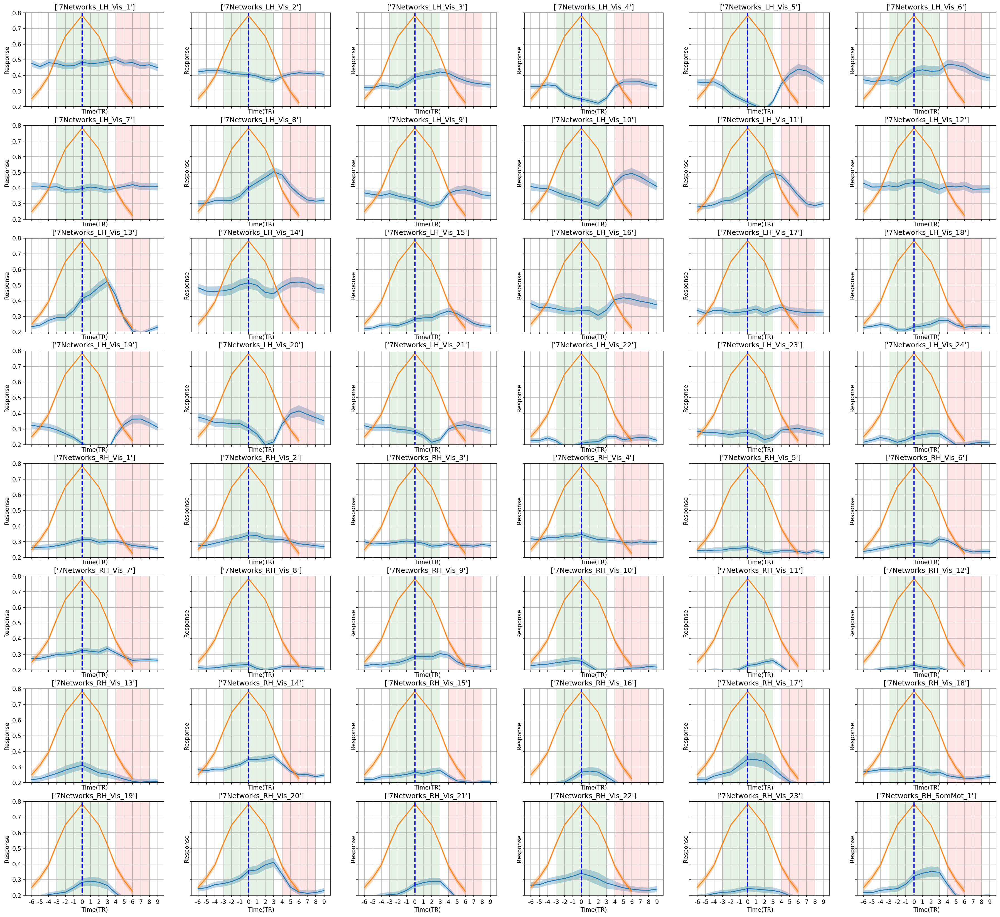

In [9]:
nw = vis
print(len(nw))
nrows, ncols = 8, 6 # 48 = 8 * 6
figsize = (5*ncols, 3.5*nrows)
plot_roi_beta_ts(nw, nrows, ncols, figsize)

### somato motor

58


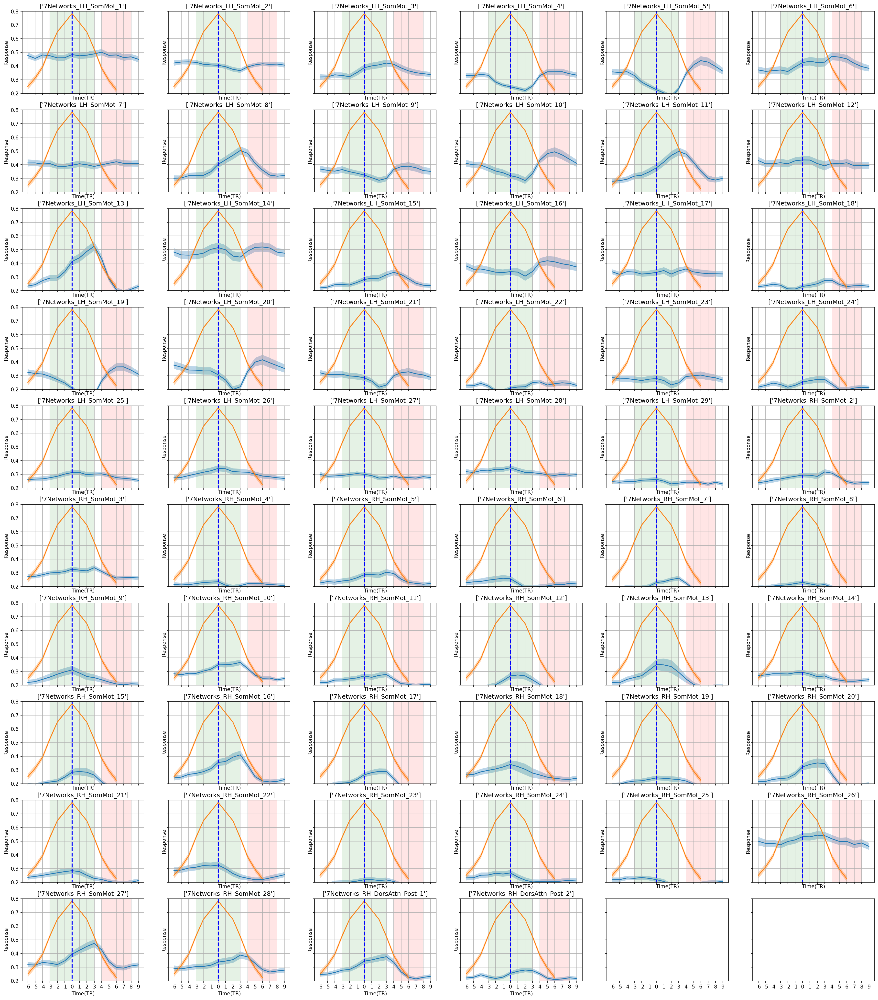

In [10]:
nw = somot
print(len(nw))
nrows, ncols = 10, 6 # 58 ~ 60 = 10 * 6
figsize = (5*ncols, 3.5*nrows)
plot_roi_beta_ts(nw, nrows, ncols, figsize)

### dorsal attention

32


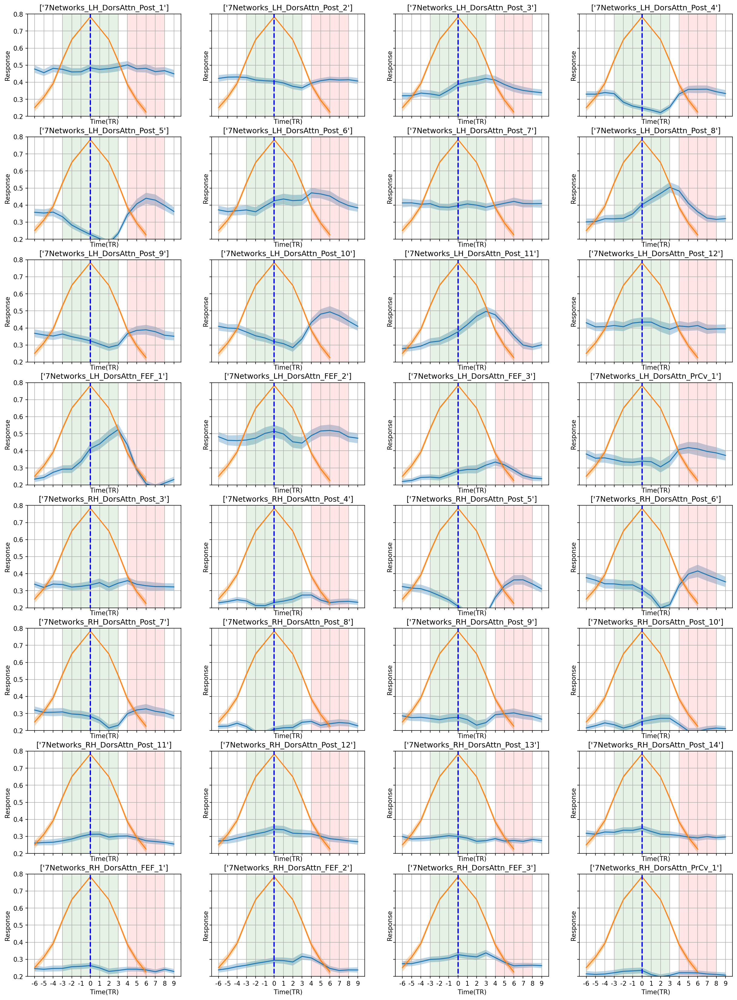

In [11]:
nw = dorsattn
print(len(nw))
nrows, ncols = 8, 4 # 32 = 8 * 4
figsize = (5*ncols, 3.5*nrows)
plot_roi_beta_ts(nw, nrows, ncols, figsize)

### ventral attention

32


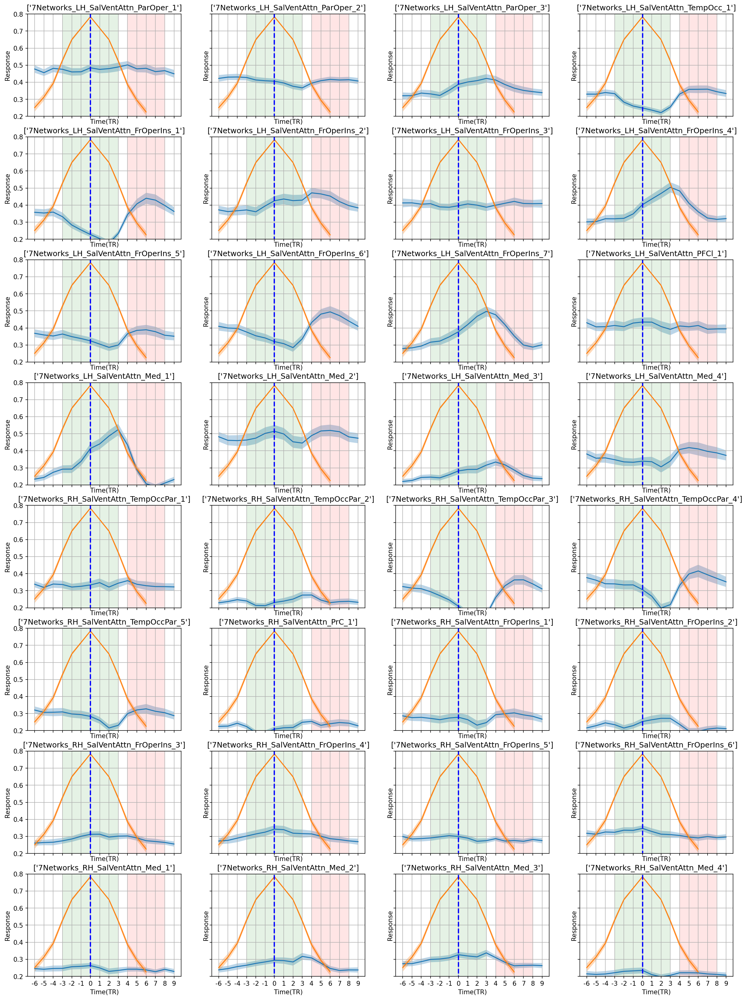

In [12]:
nw = ventattn
print(len(nw))
nrows, ncols = 8, 4 # 32 = 8 * 4
figsize = (5*ncols, 3.5*nrows)
plot_roi_beta_ts(nw, nrows, ncols, figsize)

### limbic

20


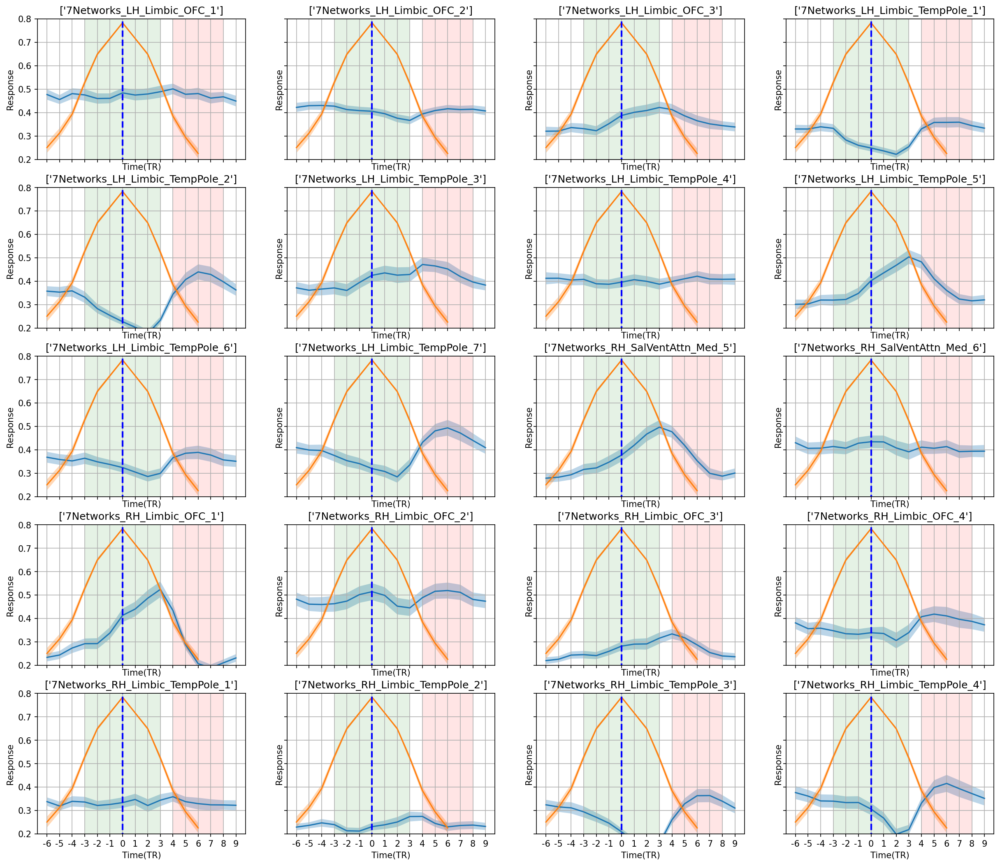

In [13]:
nw = limbic
print(len(nw))
nrows, ncols = 5, 4 # 20 = 5 * 4
figsize = (5*ncols, 3.5*nrows)
plot_roi_beta_ts(nw, nrows, ncols, figsize)

### executive control

34


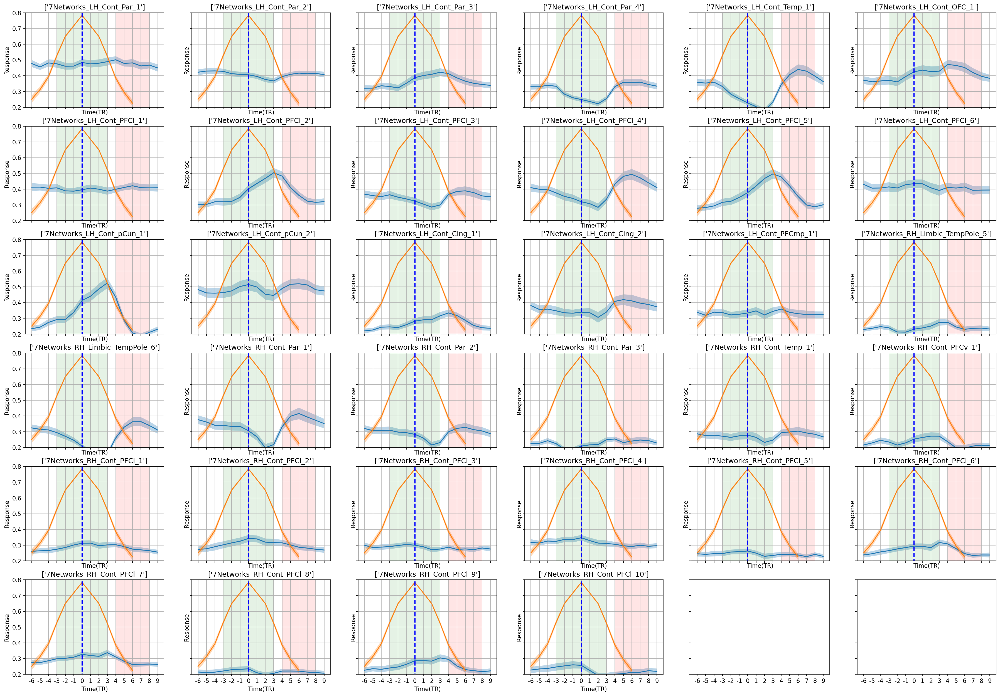

In [14]:
nw = cont
print(len(nw))
nrows, ncols = 6, 6 # 36 = 6 * 6
figsize = (5*ncols, 3.5*nrows)
plot_roi_beta_ts(nw, nrows, ncols, figsize)

### default nw

76


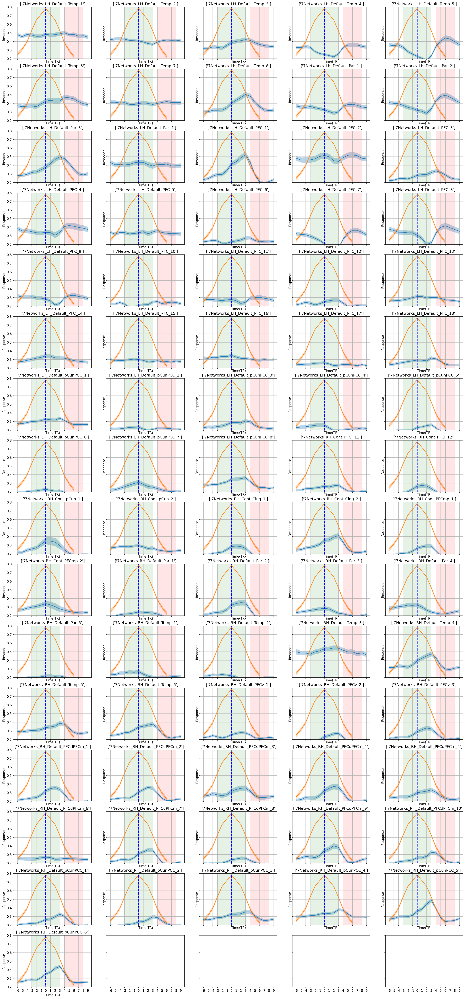

In [17]:
nw = default
print(len(nw))
nrows, ncols = 16, 5 # 76 ~ 80 = 16 * 5
figsize = (5*ncols, 3.5*nrows)
plot_roi_beta_ts(nw, nrows, ncols, figsize)